- the enable_ghost flag doesn't really do anything..?

Testing if the values are correct 
```
(x,y,z) : (134.000000,71.000000,0.000000) r: 202.368476		phi: 1.570796    theta: 0.487242	p: 25638.104915	 
(x,y,z) : (135.000000,71.000000,0.000000) r: 203.693397		phi: 1.570796    theta: 0.484173	p: 26062.908625	 
(x,y,z) : (0.000000,0.000000,1.000000) r: 0.000000		phi: nan    theta: -nan	p: 4096.000000	 
Segmentation fault
```
The reason why it crashes is that it hit the point of singularity and we have division by zero

Let's check if this is even correct: 

``(x,y,z) : (63.000000,27.000000,-32.000000) r: 93.096724		phi: 1.921681    theta: 0.404892	p: 3989.629382``

In [4]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [8]:
sqrt(63**2+27**2+32**2)

75.643902596309772

In [6]:
sqrt(63**2+27.000000**2)

68.541957952775178

The calculation is wrong , stupid mistake, now fixed.

(x,y,z) : (29.000000,25.000000,-32.000000) r: 48.031240		phi: 2.299942    theta: 0.711459	p: 1502.087432	 

In [22]:
r  = sqrt(29.000000**2+25.000000**2+32.000000**2)
r

49.899899799498598

In [12]:
arccos(-32./r)

2.2669666252418668

In [15]:
arctan(25/29.)

0.71145912573950798

In [23]:
64**2-2*64*sqrt(29**2+25**2)+r**2

1685.087431916379

So it turns out that I was running this on atheninput 2D ppi and not the 3Dppi. If I ran this on the 3D ppi where I have good 3D grid setup  it runs sucessfully

```
cycle=318 time=0.000000e+00 next dt=0.000000e+00 last dt=0.000000e+00
cycle=319 time=0.000000e+00 next dt=0.000000e+00 last dt=0.000000e+00
cycle=320 time=0.000000e+00 next dt=0.000000e+00 last dt=0.000000e+00
cycle=321 time=0.000000e+00 next dt=0.000000e+00 last dt=0.000000e+00
cycle=322 time=0.000000e+00 next dt=0.000000e+00 last dt=0.000000e+00
cycle=323 time=0.000000e+00 next dt=0.000000e+00 last dt=0.000000e+00
```

This is stuck in a loop I think the CFL condition is too low? 

(x,y,z) : (27.000000,56.000000,7.000000) r: 62.561969		phi: 1.458672    theta: 1.121536	p: 52.352106	

In [25]:
r = sqrt(27**2+56**2+7**2)
r

62.561969278468212

In [18]:
arctan(56/27)

1.1071487177940904

In [26]:
64**2-2*64*sqrt(27**2+56**2)+r**2

52.352106306789665

Ok verified that the values are correct

this might be due to the time setting in the output block of the input file 

I've hit cycle to over a thousand and there's still no increase in timestep so I decided to stop it 

cycle=1024 time=0.000000e+00 next dt=0.000000e+00 last dt=0.000000e+00


Okay the reason why it was doing this was that my x3min and x3max were set to the same value but my Nx3 is a finite number so it was confused as to whether there is an extra dimension in the x3 direction or no . After I fixed this, there is now finite dt outputs and run finishes in like 3 seconds

Used volume rendering to check that grid is behaving the way I want it to . Constant density for now.

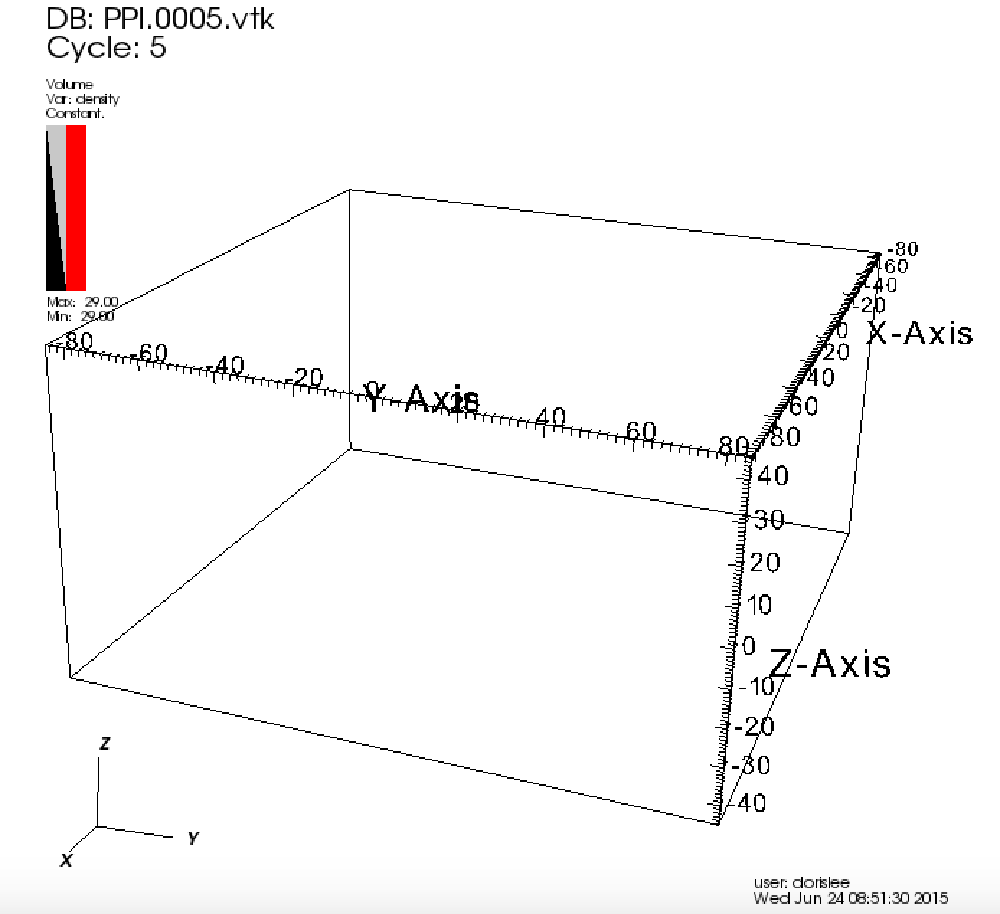

In [1]:
from IPython.display import Image
Image(filename='../data/grid.png',width=500) 

In [10]:
import io
import base64
from IPython.display import HTML
video = io.open('../data/quarter_torus_movie.mov', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video width="400" height="300" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

This correspond with the cross section that we saw in 2D since if the boundary is not enforced then  the gas just spreads out overtime (outer region become less dense)

Quater of a donut now so now I just have to shift the i,j,k coordinates again and possible expand the boxsize.

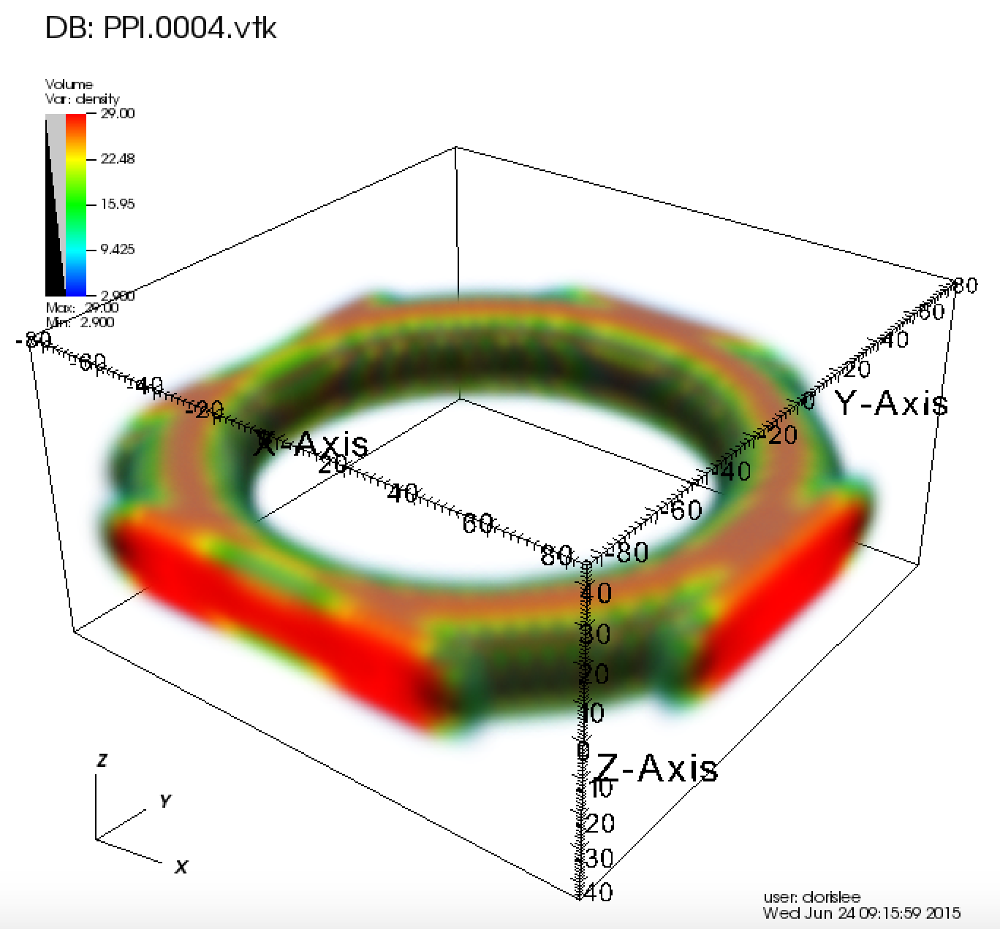

In [12]:
Image(filename='../data/fat_torus.png',width=500) 

Donut too fat for the box

Changing the xmin xmax and ymin y max doesn't really change the size of the box, it changes the labels on the axis, to really change the size of the box you need to increase the number of zones since that is what actualy determines numbers of grid cells N1,N2,N3'

I set up a 256x256x64 zone box, it runs sucessfully but its too heavy for VisIt to volume render on my laptop so it crashes everytime.

using 150x150x64,(not multiple of 2!)

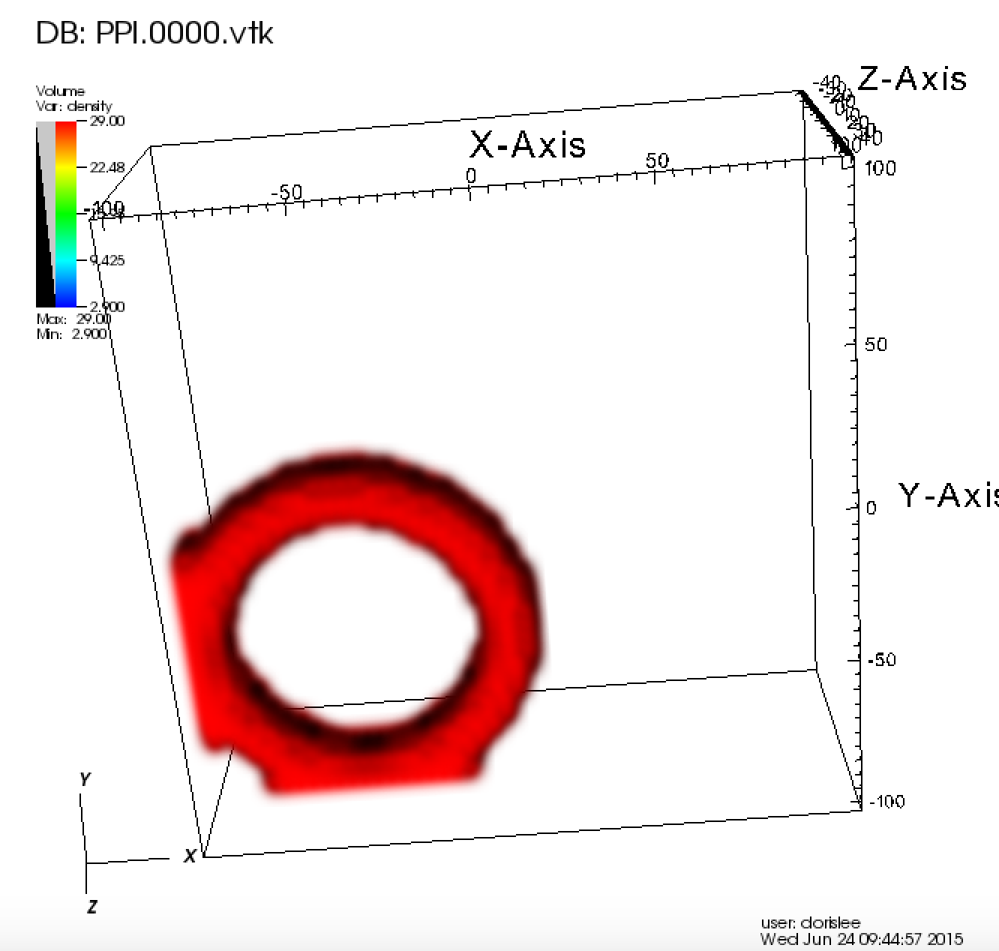

In [13]:
Image(filename='../data/displacedtorus.png',width=500) 

So need to add in something that automatically adjusts for the displacement 

Resolution is now 200x200x64

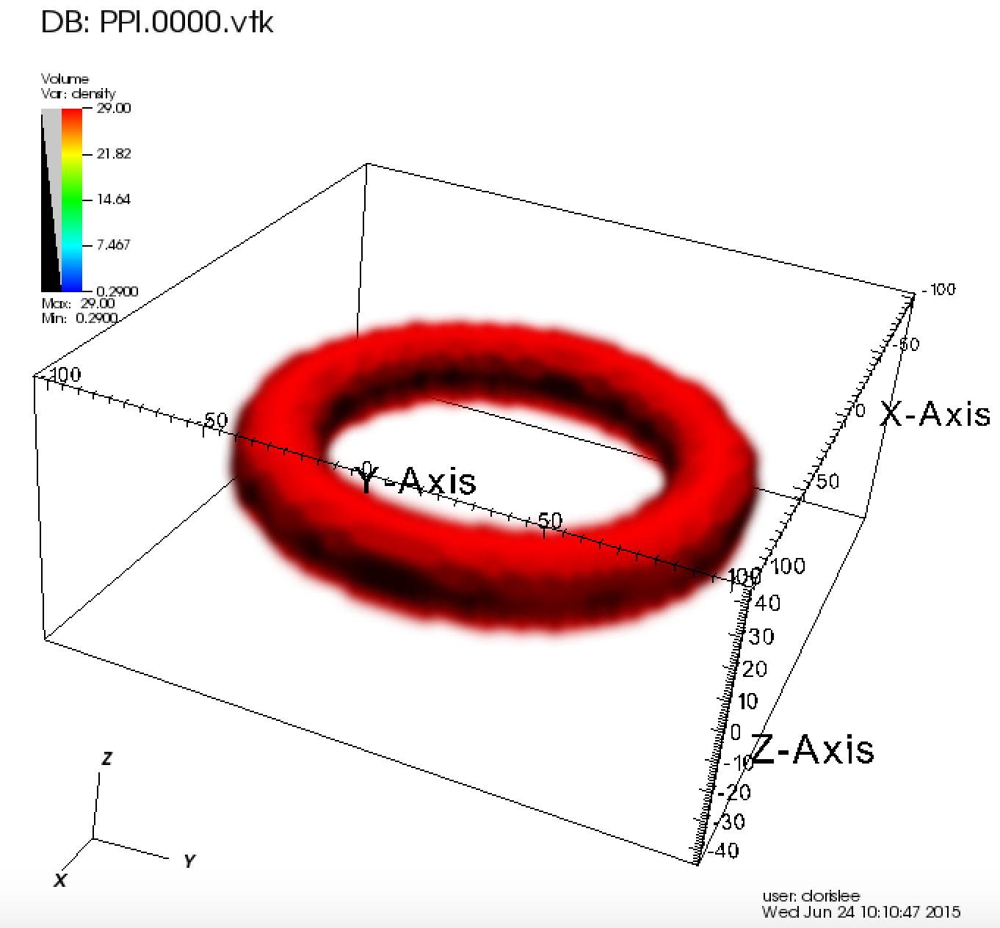

In [14]:
Image(filename='../data/3Dtorus.png',width=500) 

### Switching into cylindrical geometry

- [Cylindrical documentation](https://trac.princeton.edu/Athena/wiki/AthenaDocsCylIntro)
- --with-coord=cylindrical
- ran my old code and it looks like a large rectangular box
    - using visit command to do coordinate transform I still cant visualize the result in cyclindrical coordinate
- so now instead I am using a cylblast to test what the output data should look like and what I need to do in VisIT to transform these coordinates properly.

``./configure --with-problem=cylblast  --with-coord=cylindrical  ;make clean;make all``
- Even this with the coordinate transform doesn't give me what I want
   - this applies a Cartesian --> Cylindrical coordinate transform: 

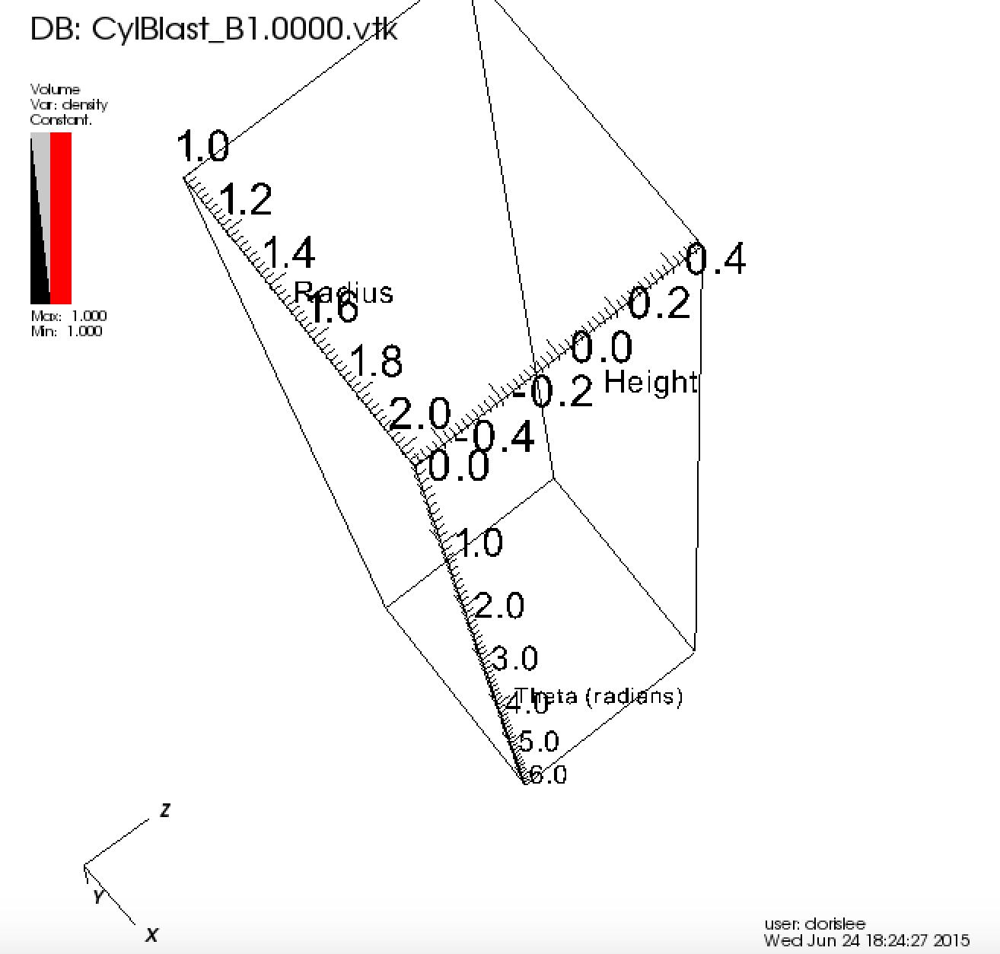

In [15]:
Image(filename='../data/cylindrical.png',width=500) 

But the axes is right, so maybe it just shows only the stretched out version of the cylindrical coordinate plots? 

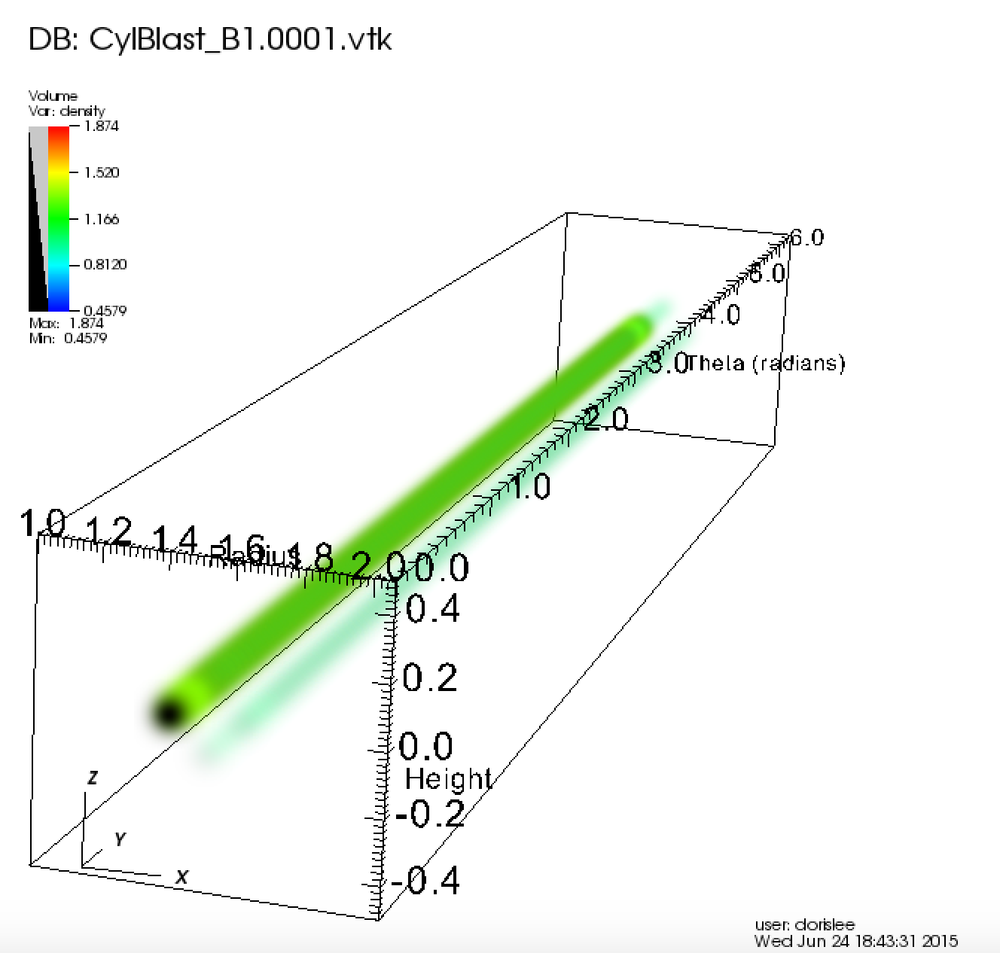

In [17]:
Image(filename='../data/cylindrical_blast_wave_3D.png',width=500) 

Yes I was right about how VisIT only shows stretched out versions of cylindrical boxes, mine should look something line this $\theta$ spans from 0 to 2$\pi$

Okay I got the cylindrical thing to run, from looking at the blast wave example it looks like the code almost remains completely the same as I had it in the 3D cartesian way 

```
cycle=0 time=0.000000e+00 next dt=4.969698e-02
Segmentation fault
```

This is how this thing looks in cartesian 

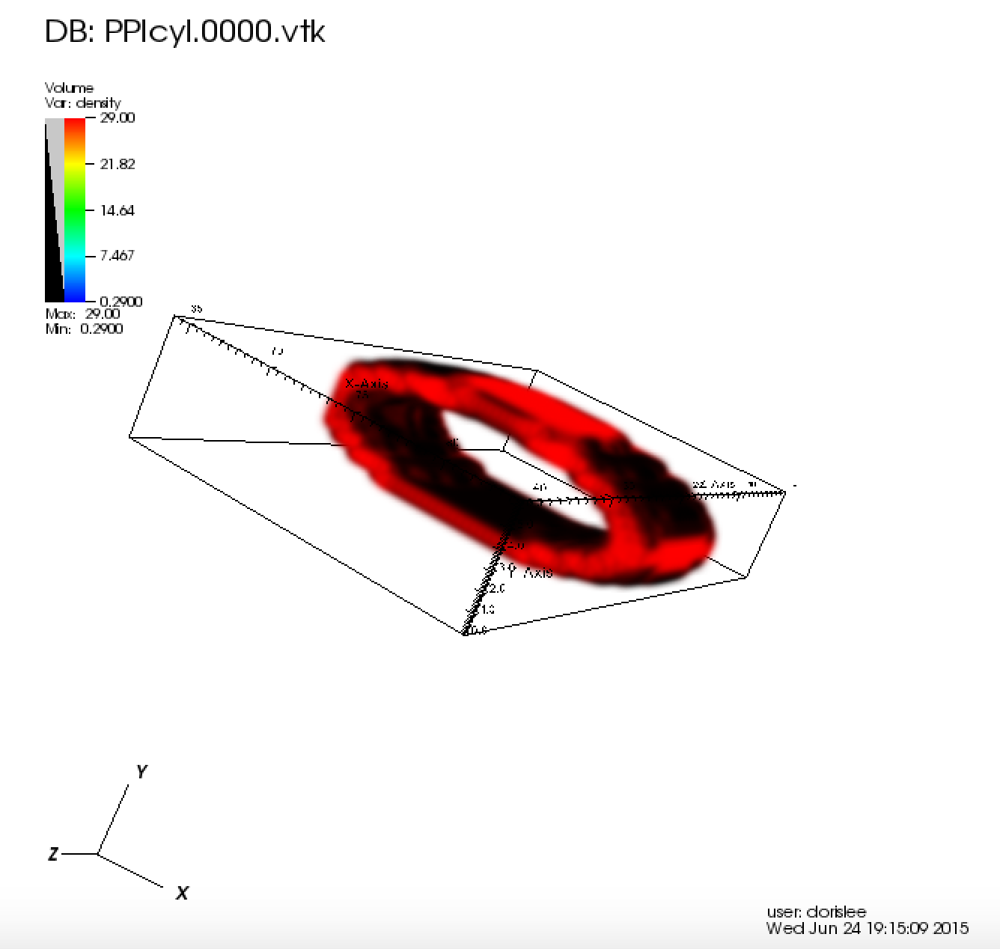

In [18]:
Image(filename='../data/cartesian.png',width=500) 

checked again that athena defaults for (x1,x2,x3) = (R,\phi,z)
but why did I change x2 and R became that??

###HPC class: Isothermal Turbulence problem
- histogram of density should have a log norm fit 
    - just plotting the histogram of volume averaged densities would give you something like the first moment
    - histogram of mass-averaged density since its rho ^2 would give you a second moment like thng
- ``athinput.turb`` and ``turb.c``
- ``./configure --with-problem=turb --enable-fft --with-integrator=vl --with-gas=hydro --with-eos=isothermal --with-order=2p --enable-mpi``
- (x1,x2,x3) = (R,$\phi$,z)
- only octant of a domain if you look at one folder output of the vtk files per processor, so you need to use athena scripts to join these up in order for these to be visualized correctly 
    - in athena ++ everything is in one file so only one single hdf5 file.

- between injection scale and dissapation scale
    - you determine "inertial range" of turbulence
    - Kologomorov spectrum

###Question/To Do
- do the number of zones have to be in powers of 2? 
- In looking at how the indexing result of my boundary function is used, it seems like it only loops thorugh i [0,3] ; j[0,71]; k[0,4]
so the ghost cells don't even touch the torus. How can I enforce the BC?
- In Hawley's paper he seems do express number of zones in terms of $r,\theta,\phi$ but we grid by x,y,z. I am not sure how this Boyer-Linquist coordinate (logarithmic radial grid) could be done on Athena? (only option I see is cartesian and cylindrical?)
- calculate $\rho$ and P required (right now it is just mocked number)
- adding in the pseudo-Newtonian potential, how? (that influences the Poisson solver?)
- adding extra grids at other levels for more resolved region inside the torus?